# Individual Project

## Petrosyan Sargis

In [484]:
import numpy as np  #for numeric operations
import pandas as pd #to analyse,clean,filter,manipulate ,explore datasets
import matplotlib.pyplot as plt #Data visuvalization and analysis
%matplotlib inline
import seaborn as sns #for advance visuvalizations with matplotlib
from IPython.display import Image  #importing libary to display the image
import os #import operating system to direct the folders
import datetime # datetime is useful to date_time series analysis
import plotly.express as px # useful plotting
from plotly.offline import init_notebook_mode # useful for visuvalization of plotly is not visuvalizing
import json
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from warnings import filterwarnings
filterwarnings(action='ignore', category=FutureWarning)
!pip install pycountry
import pycountry
import math
from scipy import stats
from scipy.stats import norm
# Fetch ISO3 country codes
valid_iso3_codes = [country.alpha_3 for country in pycountry.countries]

# Convert to set for faster lookup
valid_iso3_set = set(valid_iso3_codes)

init_notebook_mode(connected=True)

In [485]:
df = pd.read_csv("climate_change_indicators.csv")
df

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
1,2,Albania,AL,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
2,3,Algeria,DZ,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
3,4,American Samoa,AS,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
4,5,"Andorra, Principality of",AD,AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,221,Western Sahara,EH,ESH,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.423,1.401,1.510,1.732,2.204,0.942,1.477,2.069,1.593,1.970
221,222,World,NaN,WLD,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.016,1.053,1.412,1.660,1.429,1.290,1.444,1.711,1.447,1.394
222,223,"Yemen, Rep. of",YE,YEM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,224,Zambia,ZM,ZMB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.790,0.917,1.450,1.401,0.105,0.648,0.855,0.891,0.822,0.686


In [486]:
df.drop(['ISO2', 'CTS_Code', 'CTS_Name', 'CTS_Full_Descriptor', ], axis=1, inplace=True)
df.columns = df.columns.str.replace('F', '')
df = df[df['ISO3'].isin(valid_iso3_set)]
df

,ObjectId,Country,ISO3,Indicator,Unit,Source,1961,1962,1963,1964,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,1,"Afghanistan, Islamic Rep. of",AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,-0.113,-0.164,0.847,-0.764,...,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
1,2,Albania,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.627,0.326,0.075,-0.166,...,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
2,3,Algeria,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.164,0.114,0.077,0.250,...,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
3,4,American Samoa,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.079,-0.042,0.169,-0.140,...,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
4,5,"Andorra, Principality of",AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.736,0.112,-0.752,0.308,...,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,220,West Bank and Gaza,PSE,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,-0.110,0.822,0.848,-0.626,...,1.114,0.863,1.326,1.615,0.735,2.007,1.204,1.455,1.787,1.074
220,221,Western Sahara,ESH,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.632,0.576,0.333,0.819,...,1.423,1.401,1.510,1.732,2.204,0.942,1.477,2.069,1.593,1.970
222,223,"Yemen, Rep. of",YEM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.029,-0.009,0.169,-0.251,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,224,Zambia,ZMB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.228,-0.168,-0.390,-0.279,...,0.790,0.917,1.450,1.401,0.105,0.648,0.855,0.891,0.822,0.686


### About Dataset:¶
This dataset have 225 row and 72 columns.

This dataset provides a data about the climate change indicators in the year of 1961 to 2022 on our earth.

In [487]:
df.shape

(224, 68)

### Data Preparation

In [488]:
df.head()

,ObjectId,Country,ISO3,Indicator,Unit,Source,1961,1962,1963,1964,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,1,"Afghanistan, Islamic Rep. of",AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,-0.113,-0.164,0.847,-0.764,...,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
1,2,Albania,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.627,0.326,0.075,-0.166,...,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
2,3,Algeria,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.164,0.114,0.077,0.250,...,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
3,4,American Samoa,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.079,-0.042,0.169,-0.140,...,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
4,5,"Andorra, Principality of",AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.736,0.112,-0.752,0.308,...,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243


In [489]:
df.tail()

,ObjectId,Country,ISO3,Indicator,Unit,Source,1961,1962,1963,1964,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
219,220,West Bank and Gaza,PSE,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,-0.110,0.822,0.848,-0.626,...,1.114,0.863,1.326,1.615,0.735,2.007,1.204,1.455,1.787,1.074
220,221,Western Sahara,ESH,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.632,0.576,0.333,0.819,...,1.423,1.401,1.510,1.732,2.204,0.942,1.477,2.069,1.593,1.970
222,223,"Yemen, Rep. of",YEM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.029,-0.009,0.169,-0.251,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,224,Zambia,ZMB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.228,-0.168,-0.390,-0.279,...,0.790,0.917,1.450,1.401,0.105,0.648,0.855,0.891,0.822,0.686
224,225,Zimbabwe,ZWE,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.267,0.237,-0.458,-0.097,...,0.118,0.025,0.970,1.270,0.088,0.453,0.925,0.389,-0.125,-0.490


In [490]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 224 entries, 0 to 224
Data columns (total 68 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ObjectId   224 non-null    int64  
 1   Country    224 non-null    object 
 2   ISO3       224 non-null    object 
 3   Indicator  224 non-null    object 
 4   Unit       224 non-null    object 
 5   Source     224 non-null    object 
 6   1961       187 non-null    float64
 7   1962       188 non-null    float64
 8   1963       187 non-null    float64
 9   1964       187 non-null    float64
 10  1965       187 non-null    float64
 11  1966       191 non-null    float64
 12  1967       190 non-null    float64
 13  1968       190 non-null    float64
 14  1969       189 non-null    float64
 15  1970       188 non-null    float64
 16  1971       190 non-null    float64
 17  1972       191 non-null    float64
 18  1973       192 non-null    float64
 19  1974       191 non-null    float64
 20  1975       187 

In [491]:
# descriptive statistics
display(df.describe().round(2).T)
display(df.describe(include = ['object', 'bool', 'category']).T)

,count,mean,std,min,25%,50%,75%,max
ObjectId,224.0,112.51,64.83,1.00,56.75,112.50,168.25,225.00
1961,187.0,0.16,0.41,-0.69,-0.10,0.06,0.32,1.89
1962,188.0,-0.01,0.34,-0.91,-0.16,-0.06,0.12,1.00
1963,187.0,-0.01,0.39,-1.27,-0.21,-0.01,0.23,1.20
1964,187.0,-0.07,0.31,-0.88,-0.23,-0.06,0.13,1.10
...,...,...,...,...,...,...,...,...
2018,212.0,1.30,0.60,0.24,0.86,1.12,1.83,2.77
2019,212.0,1.44,0.47,0.05,1.17,1.41,1.70,2.69
2020,211.0,1.55,0.62,0.23,1.16,1.48,1.84,3.69
2021,212.0,1.34,0.49,-0.42,1.02,1.33,1.63,2.68


,count,unique,top,freq
Country,224,224,"Afghanistan, Islamic Rep. of",1
ISO3,224,224,AFG,1
Indicator,224,1,Temperature change with respect to a baseline ...,224
Unit,224,1,Degree Celsius,224
Source,224,1,Food and Agriculture Organization of the Unite...,224


In [492]:
df.index

Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
       ...
       214, 215, 216, 217, 218, 219, 220, 222, 223, 224],
      dtype='int64', length=224)

In [493]:
df.columns

Index(['ObjectId', 'Country', 'ISO3', 'Indicator', 'Unit', 'Source', '1961',
       '1962', '1963', '1964', '1965', '1966', '1967', '1968', '1969', '1970',
       '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979',
       '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988',
       '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997',
       '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006',
       '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
      dtype='object')

In [494]:
year_list = []
for i in range(1963, 2023):
    year = f"{i}"
    year_list.append(year)
    
df_melt = pd.melt(df, id_vars = ["Country"], value_vars = year_list)
df_melt.rename(columns={"variable":"Year", "value":"Tempurate_Change"}, inplace = True)
df_melt['Year'] = df_melt['Year'].str.replace(r'F', '', regex=True)
df_melt['Year'] = df_melt['Year'].astype(int)

In [495]:
df.values

array([[1, 'Afghanistan, Islamic Rep. of', 'AFG', ..., 0.498, 1.327,
        2.012],
       [2, 'Albania', 'ALB', ..., 1.498, 1.536, 1.518],
       [3, 'Algeria', 'DZA', ..., 1.926, 2.33, 1.688],
       ...,
       [223, 'Yemen, Rep. of', 'YEM', ..., nan, nan, nan],
       [224, 'Zambia', 'ZMB', ..., 0.891, 0.822, 0.686],
       [225, 'Zimbabwe', 'ZWE', ..., 0.389, -0.125, -0.49]], dtype=object)

In [496]:
df.set_index('ObjectId',inplace=True)#for setting customized index

In [497]:
df.head()

,Country,ISO3,Indicator,Unit,Source,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
ObjectId,,,,,,,,,,,,,,,,,,,,,
1,"Afghanistan, Islamic Rep. of",AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,-0.113,-0.164,0.847,-0.764,-0.244,...,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
2,Albania,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.627,0.326,0.075,-0.166,-0.388,...,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
3,Algeria,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.164,0.114,0.077,0.250,-0.100,...,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
4,American Samoa,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.079,-0.042,0.169,-0.140,-0.562,...,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
5,"Andorra, Principality of",AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.736,0.112,-0.752,0.308,-0.490,...,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243


# Data Cleaning


In [498]:
mask=df.isnull()  #isnullfunctions checks for null in dataset and gives boolean output 
df[mask]          #mask is variable which stores True values
                  # in this dataset doesnt have any null values so it showing NaN

,Country,ISO3,Indicator,Unit,Source,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
ObjectId,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [499]:
print(df.isnull().sum()) #null values in some columns

Country       0
ISO3          0
Indicator     0
Unit          0
Source        0
             ..
2018         12
2019         12
2020         13
2021         12
2022         12
Length: 67, dtype: int64


In [500]:
# Loop through each column and fill missing values with the mean if the column contains numeric data
for column in df.columns:
    if df[column].dtype in ['int64', 'float64']:
        df[column].fillna(df[column].mean(), inplace=True)

C:\Users\S145\AppData\Local\Temp\ipykernel_10244\2803045451.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [501]:
print(df.isnull().sum()) #null values in some columns #all  null values are filled with randam value to get error and null free data

Country      0
ISO3         0
Indicator    0
Unit         0
Source       0
            ..
2018         0
2019         0
2020         0
2021         0
2022         0
Length: 67, dtype: int64


In [502]:
df.duplicated() #checks for duplicates in this dataset

ObjectId
1      False
2      False
3      False
4      False
5      False
       ...  
220    False
221    False
223    False
224    False
225    False
Length: 224, dtype: bool

In [503]:
# if there is duplicates treat it with drop_dupliacates for error free dataset
#checks for duplicates in this dataset
df.drop_duplicates(inplace=True)
len(df)   #the length before drop duplicates and after is same therefore there are no dupliacates in dataset
#if length and drop duplicates changes then there are duplicates

C:\Users\S145\AppData\Local\Temp\ipykernel_10244\411942646.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



224

In [504]:
df.nunique()  #give the count of unique numbers in dataset by columns vise

Country      224
ISO3         224
Indicator      1
Unit           1
Source         1
            ... 
2018         200
2019         197
2020         196
2021         199
2022         206
Length: 67, dtype: int64

In [505]:
df['Indicator'].unique()  #give the unique  array in dataset  with respect to column given

array(['Temperature change with respect to a baseline climatology, corresponding to the period 1951-1980'],
      dtype=object)

In [506]:
df['Unit'].unique()  #give the unique  array in dataset  with respect to column given

array(['Degree Celsius'], dtype=object)

# Data Visualization

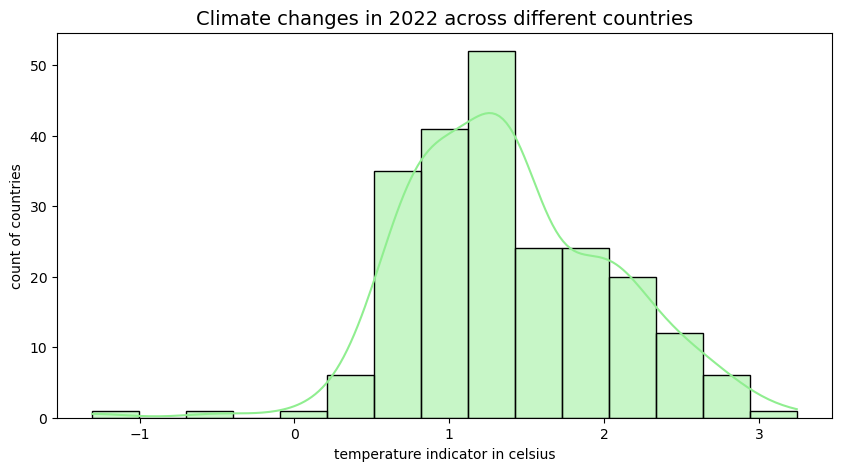

In [507]:
plt.figure(figsize=(10,5))
sns.histplot(df["2022"],color="lightgreen",kde=True)  # using seaborn to plot histogram
plt.title("Climate changes in 2022 across different countries",fontsize=14 )
plt.xlabel("temperature indicator in celsius")
plt.ylabel("count of countries")
plt.show()

### Tempurate Mapping

In [508]:
access_token = 'pk.eyJ1IjoiYWJkdWxrZXJpbW5lc2UiLCJhIjoiY2s5aThsZWlnMDExcjNkcWFmaWUxcmh3YyJ9.s-4VLvmoPQFPXdu9Mcd6pA'
px.set_mapbox_access_token(access_token)

In [509]:
f = open(r'countries.geo.json')
world_json = json.load(f)

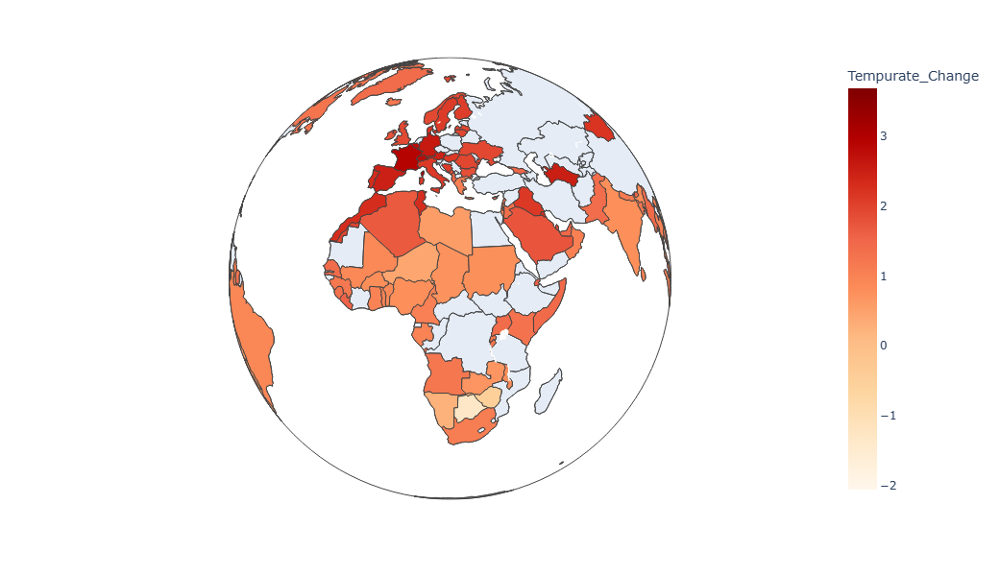

In [510]:
import plotly.express as px

fig = px.choropleth(
    df_melt,
    geojson=world_json,
    featureidkey='properties.name',
    locations='Country',
    color='Tempurate_Change',
    color_continuous_scale='orrd',
    projection='orthographic'
)
fig.update_geos(
    fitbounds="locations",
    visible=True
)
fig.update_layout(
    geo=dict(
        bgcolor='rgba(0,0,0,0)',
        showland=True, 
        showcountries=True 
    ),
    height=600,  
    width=800  
)


fig.show()

In [511]:
df2=df.copy()

In [512]:
df3 = pd.read_csv("Metadata_Country_API_NY.GDP.MKTP.CD_DS2_en_csv_v2_6298258.csv")
df3.rename(columns={"TableName": "Country", "Region": "Sub-Region", "IncomeGroup": "Income Group"}, inplace =True)
df3.drop(columns=['Unnamed: 5', 'SpecialNotes', 'Country Code'], inplace=True)

In [513]:
df4= pd.read_csv('world_population_data.csv')
columns_to_drop = ['rank', 'cca3', '2022 population', '2020 population',	'2015 population', '2010 population',	'2000 population',	'1990 population',	'1980 population',
                   '1970 population', '2023 population', 'growth rate', 'world percentage', 'continent']
df4.drop(columns_to_drop, axis=1, inplace=True)
df4.rename(columns={"country": "Country", "area (km²)": "Area (KM²)", "density (km²)": "Density (KM²)"}, inplace =True)
df4

,Country,Area (KM²),Density (KM²)
0,India,3287590.00,481
1,China,9706961.00,151
2,United States,9372610.00,37
3,Indonesia,1904569.00,148
4,Pakistan,881912.00,312
...,...,...,...
229,Montserrat,102.00,43
230,Falkland Islands,12173.00,0
231,Niue,261.00,7
232,Tokelau,12.00,189


In [514]:
# Perform inner join based on the "Country" column
merged_data = pd.merge(df2, df3, on="Country").merge(df4, on="Country")
# Save the merged data into a new CSV file

In [515]:
merged_data

,Country,ISO3,Indicator,Unit,Source,1961,1962,1963,1964,1965,...,2017,2018,2019,2020,2021,2022,Sub-Region,Income Group,Area (KM²),Density (KM²)
0,Albania,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.627,0.326,0.075,-0.166,-0.388,...,1.121,2.028,1.675,1.498,1.536,1.518,Europe & Central Asia,Upper middle income,28748.0,103
1,Algeria,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.164,0.114,0.077,0.250,-0.100,...,1.512,1.210,1.115,1.926,2.330,1.688,Middle East & North Africa,Lower middle income,2381741.0,19
2,American Samoa,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.079,-0.042,0.169,-0.140,-0.562,...,1.435,1.189,1.539,1.430,1.268,1.256,East Asia & Pacific,High income,199.0,220
3,Angola,AGO,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.041,-0.152,-0.190,-0.229,-0.196,...,0.870,1.395,1.752,1.162,1.553,1.212,Sub-Saharan Africa,Lower middle income,1246700.0,29
4,Antigua and Barbuda,ATG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.090,0.031,0.288,0.214,-0.385,...,0.958,0.627,0.797,1.131,0.862,0.770,Latin America & Caribbean,High income,442.0,214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,United States,USA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.003,-0.026,0.418,-0.282,-0.362,...,1.433,1.276,1.034,1.324,1.144,1.217,North America,High income,9372610.0,37
137,Uruguay,URY,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.398,-0.473,0.330,-0.762,0.180,...,1.546,1.196,0.766,0.890,0.790,0.382,Latin America & Caribbean,High income,181034.0,20
138,Vanuatu,VUT,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.168,0.092,-0.165,0.220,-0.569,...,1.131,0.613,0.897,1.226,1.147,1.479,East Asia & Pacific,Lower middle income,12189.0,27
139,Zambia,ZMB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,0.228,-0.168,-0.390,-0.279,-0.418,...,0.105,0.648,0.855,0.891,0.822,0.686,Sub-Saharan Africa,Lower middle income,752612.0,28


In [516]:
f1 = merged_data
f1 = f1.reindex(columns=['Country', 'ISO3','Sub-Region', 'Area (KM²)',	'Density (KM²)', 'Income Group',
                                       '1961', '1962','1963', '1964', '1965', '1966', '1967', '1968', '1969', '1970', '1971',
                                        '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980',
                                        '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989',
                                        '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
                                        '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
                                        '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
                                        '2017', '2018', '2019', '2020', '2021', '2022',
                                        'Indicator', 'Unit', 'Source'])# final

In [517]:
id_cols = ['Country', 'ISO3', 'Sub-Region', 'Income Group', 'Indicator', 'Unit', 'Source',
                                      'Area (KM²)',	'Density (KM²)',]
f1 = pd.melt(f1, id_vars=id_cols, var_name='Year', value_name='Surface Temperature Change')
f1['Year'] = pd.to_numeric(f1['Year'])
f1

,Country,ISO3,Sub-Region,Income Group,Indicator,Unit,Source,Area (KM²),Density (KM²),Year,Surface Temperature Change
0,Albania,ALB,Europe & Central Asia,Upper middle income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,28748.0,103,1961,0.627
1,Algeria,DZA,Middle East & North Africa,Lower middle income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,2381741.0,19,1961,0.164
2,American Samoa,ASM,East Asia & Pacific,High income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,199.0,220,1961,0.079
3,Angola,AGO,Sub-Saharan Africa,Lower middle income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,1246700.0,29,1961,0.041
4,Antigua and Barbuda,ATG,Latin America & Caribbean,High income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,442.0,214,1961,0.090
...,...,...,...,...,...,...,...,...,...,...,...
8737,United States,USA,North America,High income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,9372610.0,37,2022,1.217
8738,Uruguay,URY,Latin America & Caribbean,High income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,181034.0,20,2022,0.382
8739,Vanuatu,VUT,East Asia & Pacific,Lower middle income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,12189.0,27,2022,1.479
8740,Zambia,ZMB,Sub-Saharan Africa,Lower middle income,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,752612.0,28,2022,0.686


In [518]:
f1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8742 entries, 0 to 8741
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Country                     8742 non-null   object 
 1   ISO3                        8742 non-null   object 
 2   Sub-Region                  8742 non-null   object 
 3   Income Group                8742 non-null   object 
 4   Indicator                   8742 non-null   object 
 5   Unit                        8742 non-null   object 
 6   Source                      8742 non-null   object 
 7   Area (KM²)                  8742 non-null   float64
 8   Density (KM²)               8742 non-null   int64  
 9   Year                        8742 non-null   int64  
 10  Surface Temperature Change  8742 non-null   float64
dtypes: float64(2), int64(2), object(7)
memory usage: 751.4+ KB


In [519]:
f1.isnull().sum()

Country                       0
ISO3                          0
Sub-Region                    0
Income Group                  0
Indicator                     0
Unit                          0
Source                        0
Area (KM²)                    0
Density (KM²)                 0
Year                          0
Surface Temperature Change    0
dtype: int64

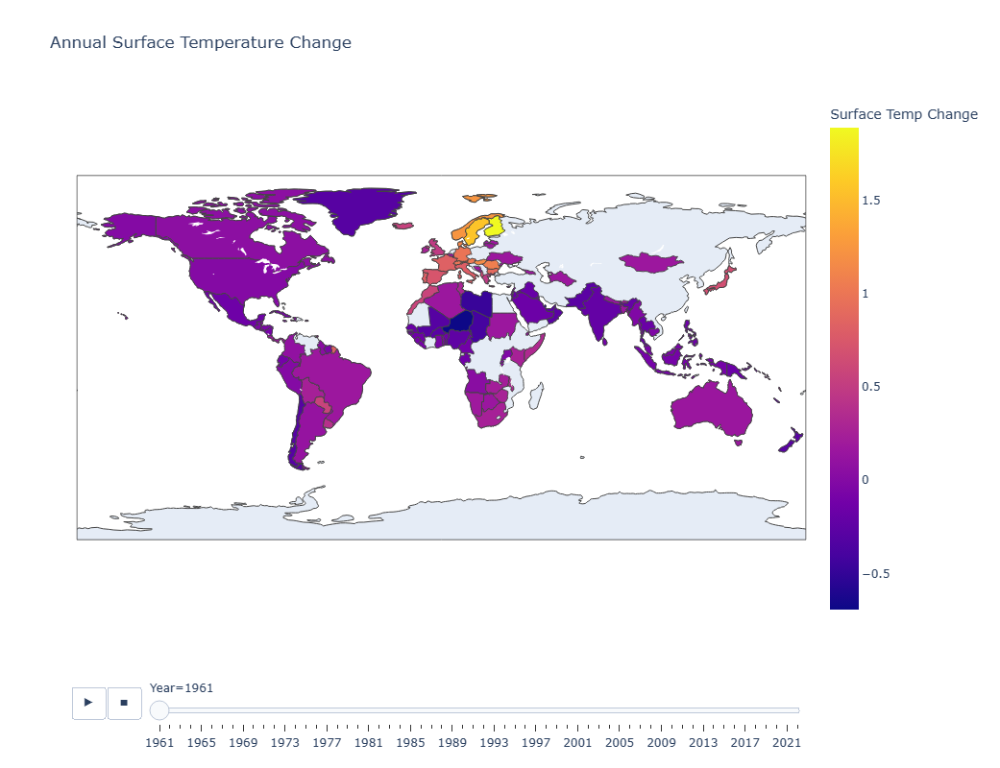

In [520]:
# Create animated choropleth map
fig = px.choropleth(f1,
                    locations="ISO3",
                    color="Surface Temperature Change",
                    hover_name="Country",
                    animation_frame="Year",
                    title="Annual Surface Temperature Change",
                    color_continuous_scale=px.colors.sequential.Plasma)

# Add titles and labels
fig.update_layout(geo=dict(showcoastlines=True),
                  coloraxis_colorbar=dict(title="Surface Temp Change"), height=800, width=1000)

# Show the plot
fig.show()

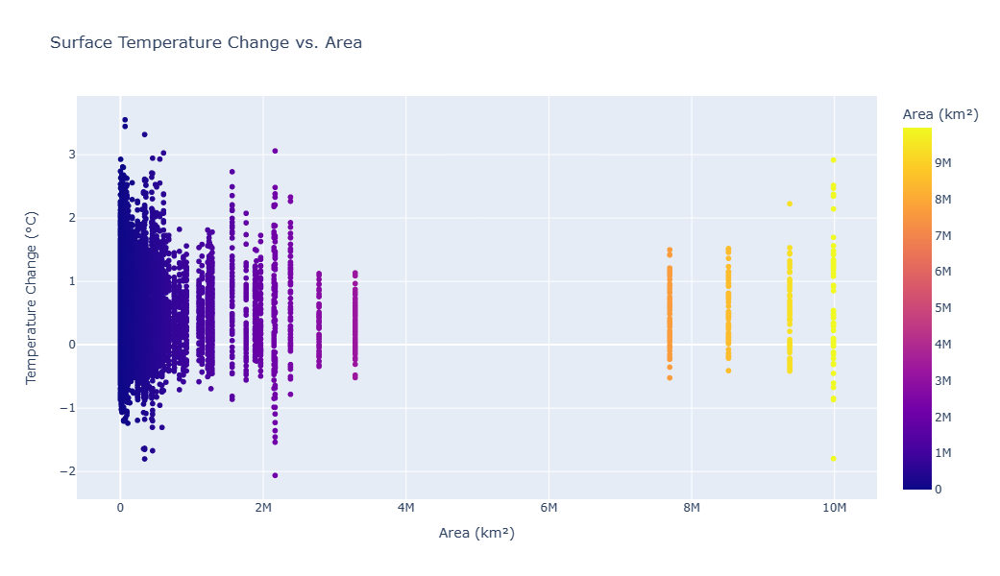

In [521]:
# Scatter plot: Surface Temperature Change vs. Area with country names
fig6 = px.scatter(f1, x='Area (KM²)', y='Surface Temperature Change', hover_data=['Country','Year'],
                  title='Surface Temperature Change vs. Area', color='Area (KM²)',
                  labels={'Surface Temperature Change': 'Temperature Change (°C)', 'Area (KM²)': 'Area (km²)'}, height=600, width=1000)
fig6.show()

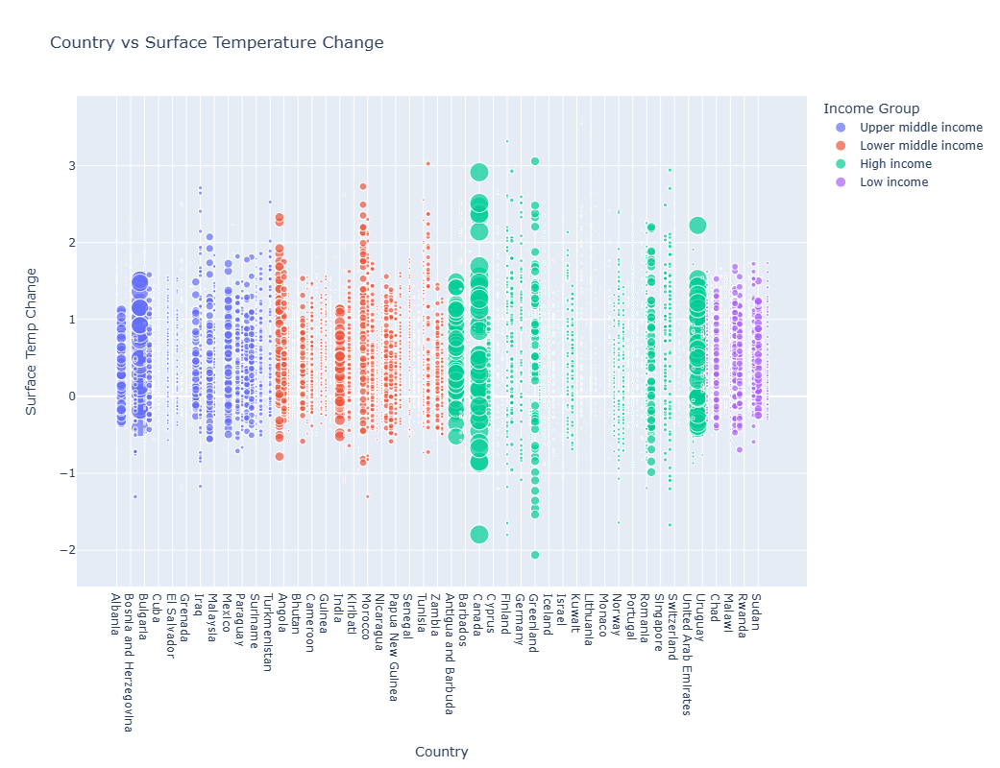

In [522]:
# Bubble Chart - Population Size vs Surface Temperature Change
fig9 = px.scatter(f1, x='Country', y='Surface Temperature Change',
                 size='Area (KM²)', color='Income Group', hover_name='Country',
                 title='Country vs Surface Temperature Change',
                 labels={'Country': 'Country', 'Surface Temperature Change': 'Surface Temp Change'},height=800, width=1000)
fig9.show()

In [523]:
# Convert the 'Year' column to datetime format
f1['Year'] = pd.to_datetime(f1['Year'], format='%Y')
f1.set_index('Year', inplace=True)

In [524]:
# Group the data by country
grouped = f1.groupby('Country')

In [525]:
# Assuming 'STC' is the column you want to forecast
f1 = f1[['Surface Temperature Change', 'Country']]
f1

,Surface Temperature Change,Country
Year,,
1961-01-01,0.627,Albania
1961-01-01,0.164,Algeria
1961-01-01,0.079,American Samoa
1961-01-01,0.041,Angola
1961-01-01,0.090,Antigua and Barbuda
...,...,...
2022-01-01,1.217,United States
2022-01-01,0.382,Uruguay
2022-01-01,1.479,Vanuatu


In [526]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

In [527]:
# Function to fit ARIMA model and make predictions for a country
def fit_arima(country_series):
    model = ARIMA(country_series, order=(5,1,0))  # Example ARIMA order
    model_fit = model.fit()
    predictions = model_fit.forecast(steps=5)  # Example forecasting 5 steps ahead
    return predictions

In [528]:
# Dictionary to store predictions for each country
predictions_dict = {}

# Loop through each country to fit the model and make predictions
for country, data in grouped:
    country_series = data['Surface Temperature Change']
    predictions = fit_arima(country_series)
    predictions_dict[country] = predictions

C:\Users\S145\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\Users\S145\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\Users\S145\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\Users\S145\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\Users\S145\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\Users\S145\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No freque

In [529]:
predictions_dict

{'Albania': 2023-01-01    1.544039
 2024-01-01    1.581766
 2025-01-01    1.556044
 2026-01-01    1.548471
 2027-01-01    1.551232
 Freq: AS-JAN, Name: predicted_mean, dtype: float64,
 'Algeria': 2023-01-01    1.779681
 2024-01-01    1.801338
 2025-01-01    1.833857
 2026-01-01    1.813484
 2027-01-01    1.836990
 Freq: AS-JAN, Name: predicted_mean, dtype: float64,
 'American Samoa': 2023-01-01    1.363247
 2024-01-01    1.339167
 2025-01-01    1.334091
 2026-01-01    1.332215
 2027-01-01    1.325819
 Freq: AS-JAN, Name: predicted_mean, dtype: float64,
 'Angola': 2023-01-01    1.417232
 2024-01-01    1.485208
 2025-01-01    1.256131
 2026-01-01    1.431288
 2027-01-01    1.365963
 Freq: AS-JAN, Name: predicted_mean, dtype: float64,
 'Antigua and Barbuda': 2023-01-01    0.913357
 2024-01-01    0.902142
 2025-01-01    0.858846
 2026-01-01    0.874160
 2027-01-01    0.882610
 Freq: AS-JAN, Name: predicted_mean, dtype: float64,
 'Argentina': 2023-01-01    0.904673
 2024-01-01    0.872355
 

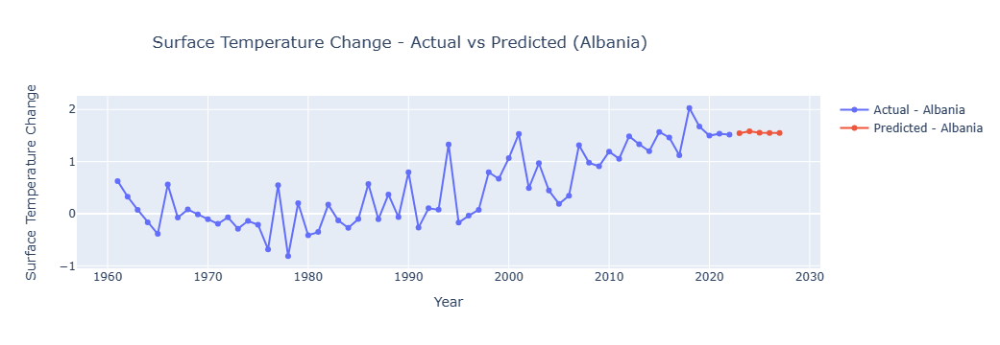

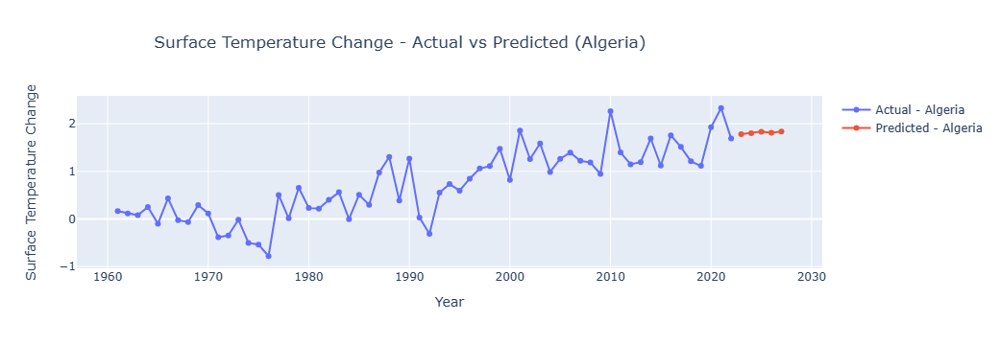

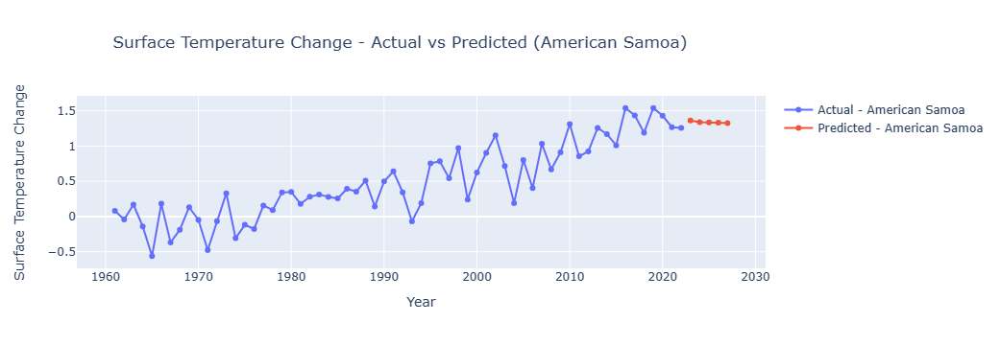

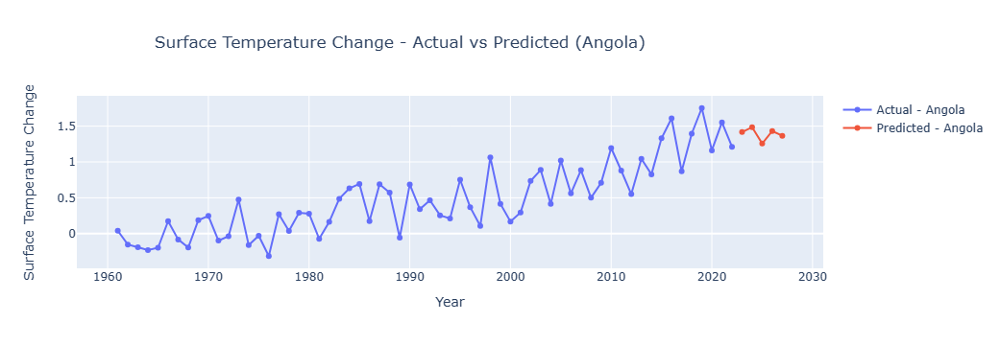

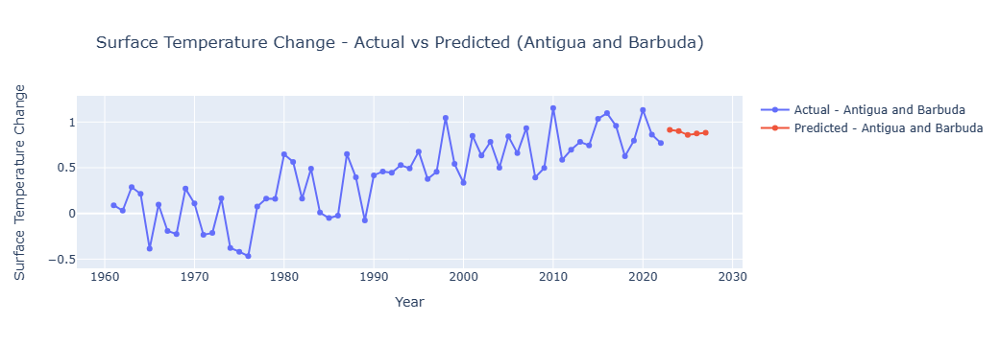

...

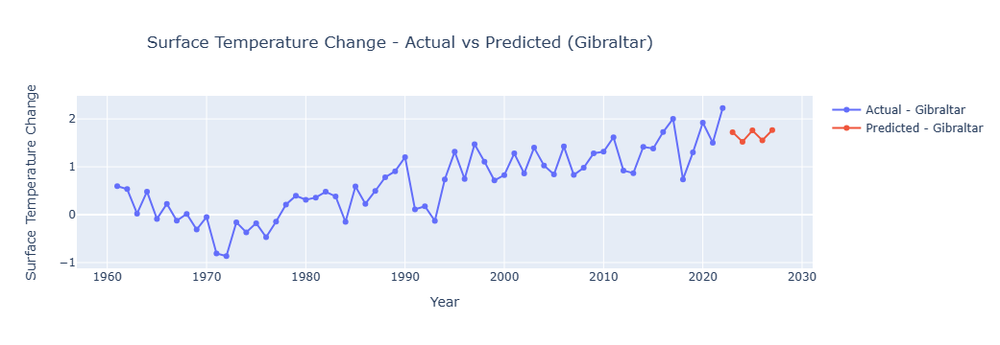

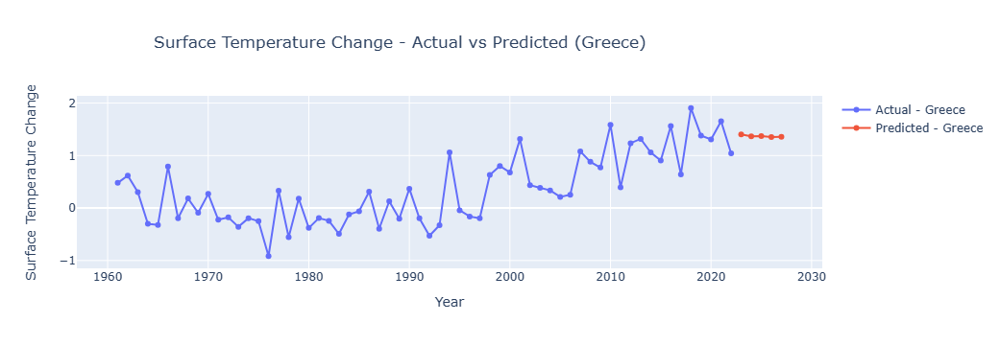

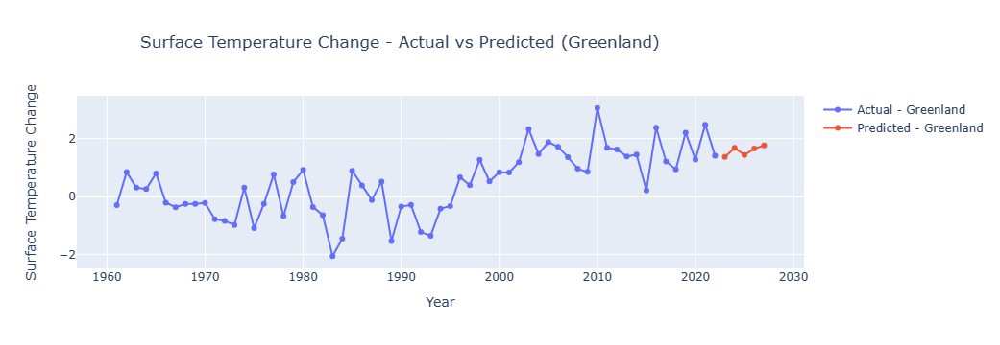

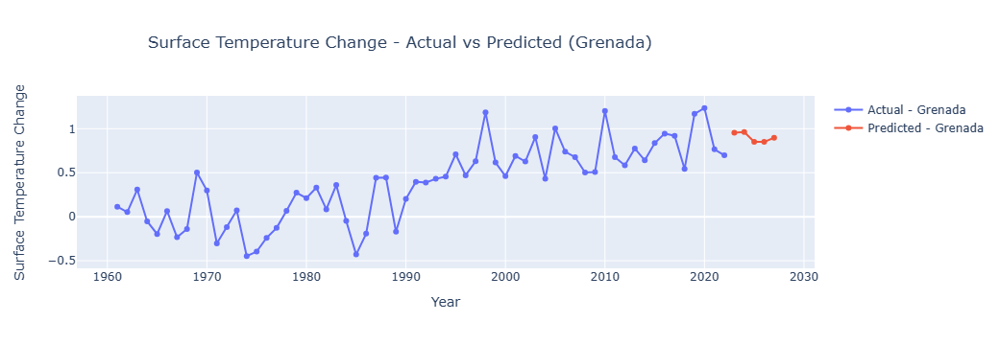

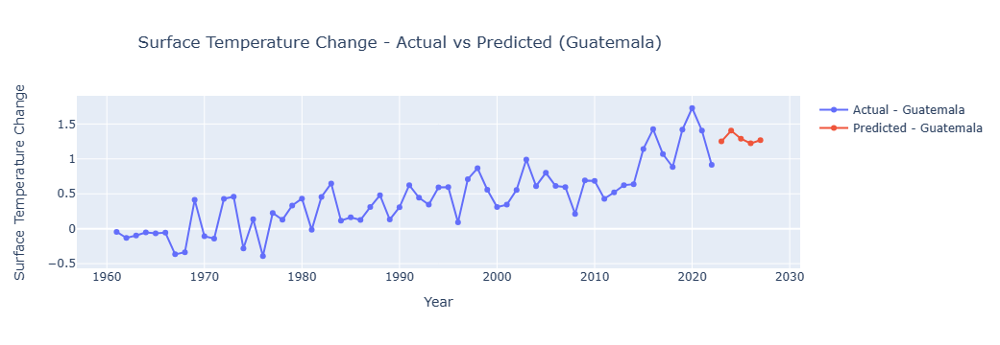

In [535]:
 #Function to plot Surface Temperature Change for each country
def plot_countries():
    # Loop through each country in predictions_dict
    for country, predictions in predictions_dict.items():
        # Get the actual Surface Temperature Change data for the country
        actual_data = f1[f1['Country'] == country]['Surface Temperature Change']

        if actual_data.empty:
            print(f"No data found for {country}.")
            continue

        # Create a figure to hold the plot
        figxxi = go.Figure()

        # Plot the actual data
        figxxi.add_trace(go.Scatter(x=actual_data.index, y=actual_data.values,
                                 mode='lines+markers', name=f'Actual - {country}'))

        # Plot the predicted values if available
        if predictions is not None:
            # Extend the time index to include the future period
            future_index = pd.date_range(start=actual_data.index[-1], periods=len(predictions), freq='Y')
            # Plot the predicted values
            figxxi.add_trace(go.Scatter(x=future_index, y=predictions,
                                     mode='lines+markers', name=f'Predicted - {country}'))

        # Update layout
        figxxi.update_layout(title=f'Surface Temperature Change - Actual vs Predicted ({country})',
                          xaxis_title='Year',
                          yaxis_title='Surface Temperature Change', title_x=0.4)

        # Show the plot
        figxxi.show()

# Call the function to plot Surface Temperature Change for each country
plot_countries()